In [1]:
import re
import pandas as pd
import bs4
import requests
import spacy
from spacy import displacy
nlp = spacy.load('en_core_web_sm')

from spacy.matcher import Matcher 
from spacy.tokens import Span 

import networkx as nx

import matplotlib.pyplot as plt
from tqdm import tqdm

pd.set_option('display.max_colwidth', 200)
%matplotlib inline

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/thinc/compat.py:36: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  hasattr(torch, "has_mps")
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/thinc/compat.py:37: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  and torch.has_mps  # type: ignore[attr-defined]


In [4]:
candidate_sentences = pd.read_csv("rmsf_papers.csv")
candidate_sentences.shape

(1788, 9)

In [6]:
candidate_sentences['Abstract'].sample(5)

998     Indirect immune fluorescence was used to detect rickettsiae in the tissues of a primate inoculated subcutaneously with Rickettsia rickettsii. Rickettsiae were identified by indirect immuno fluores...
1746    Tick modulation of host defenses facilitates both blood feeding and pathogen transmission. Several tick species deviate host T cell responses toward a Th2 cytokine profile. The majority of studies...
715     Since 2003, two communities in eastern Arizona have experienced a sustained outbreak of Rocky Mountain spotted fever (RMSF), caused by Rickettsia rickettsii, associated with transmission by Rhipic...
448     Sixteen beagle dogs were injected intradermally with Rickettsia rickettsii. The dogs were divided into four groups (n = 4): 1) infected, non-treated control; 2) infected, treated with doxycycline;...
1421    Intracellular infection of endothelial cells with Rickettsia rickettsii results in increased steady-state levels of plasminogen activator inhibitor-1 (PAI-1) mR

#1.4 Sentence Segmentation
The first step in building a knowledge graph is to split the text document or article into sentences. Then, we will shortlist only those sentences in which there is exactly 1 subject and 1 object.

In [7]:
doc = nlp("Indirect immune fluorescence was used to detect rickettsiae in the tissues of a primate inoculated subcutaneously with Rickettsia rickettsii. Rickettsiae were identified by indirect immuno fluores")

for tok in doc:
  print(tok.text, "...", tok.dep_)

Indirect ... amod
immune ... amod
fluorescence ... nsubjpass
was ... auxpass
used ... ROOT
to ... aux
detect ... xcomp
rickettsiae ... dobj
in ... prep
the ... det
tissues ... pobj
of ... prep
a ... det
primate ... pobj
inoculated ... acl
subcutaneously ... advmod
with ... prep
Rickettsia ... compound
rickettsii ... pobj
. ... punct
Rickettsiae ... nsubjpass
were ... auxpass
identified ... ROOT
by ... agent
indirect ... amod
immuno ... pobj
fluores ... punct


#1.5 Entities Extraction
The extraction of a single word entity from a sentence is not a tough task. We can easily do this with the help of parts of speech (POS) tags. The nouns and the proper nouns would be our entities.

However, when an entity spans across multiple words, then POS tags alone are not sufficient. We need to parse the dependency tree of the sentence.

To build a knowledge graph, the most important things are the nodes and the edges between them.

These nodes are going to be the entities that are present in the Wikipedia sentences. Edges are the relationships connecting these entities to one another. We will extract these elements in an unsupervised manner, i.e., we will use the grammar of the sentences.

The main idea is to go through a sentence and extract the subject and the object as and when they are encountered. However, there are a few challenges ⁠— an entity can span across multiple words, eg., “red wine”, and the dependency parsers tag only the individual words as subjects or objects.

So, I have created a function below to extract the subject and the object (entities) from a sentence while also overcoming the challenges mentioned above. I have partitioned the code into multiple chunks for your convenience:

In [8]:
def get_entities(sent):
  ## chunk 1
  ent1 = ""
  ent2 = ""

  prv_tok_dep = ""    # dependency tag of previous token in the sentence
  prv_tok_text = ""   # previous token in the sentence

  prefix = ""
  modifier = ""

  #############################################################
  
  for tok in nlp(sent):
    ## chunk 2
    # if token is a punctuation mark then move on to the next token
    if tok.dep_ != "punct":
      # check: token is a compound word or not
      if tok.dep_ == "compound":
        prefix = tok.text
        # if the previous word was also a 'compound' then add the current word to it
        if prv_tok_dep == "compound":
          prefix = prv_tok_text + " "+ tok.text
      
      # check: token is a modifier or not
      if tok.dep_.endswith("mod") == True:
        modifier = tok.text
        # if the previous word was also a 'compound' then add the current word to it
        if prv_tok_dep == "compound":
          modifier = prv_tok_text + " "+ tok.text
      
      ## chunk 3
      if tok.dep_.find("subj") == True:
        ent1 = modifier +" "+ prefix + " "+ tok.text
        prefix = ""
        modifier = ""
        prv_tok_dep = ""
        prv_tok_text = ""      

      ## chunk 4
      if tok.dep_.find("obj") == True:
        ent2 = modifier +" "+ prefix +" "+ tok.text
        
      ## chunk 5  
      # update variables
      prv_tok_dep = tok.dep_
      prv_tok_text = tok.text
  #############################################################

  return [ent1.strip(), ent2.strip()]

In [10]:
get_entities("Indirect immune fluorescence was used to detect rickettsiae in the tissues of a primate inoculated subcutaneously with Rickettsia rickettsii")

['immune  fluorescence', 'subcutaneously Rickettsia rickettsii']

In [11]:
entity_pairs = []

for i in tqdm(candidate_sentences["Abstract"]):
  entity_pairs.append(get_entities(i))

100%|███████████████████████████████████████| 1788/1788 [01:13<00:00, 24.42it/s]


In [12]:
entity_pairs[10:20]

[['Doxycycline', 'even  infants'],
 ['', ''],
 ['', ''],
 ['', ''],
 ['cases', 'molecular  methods'],
 ['', ''],
 ['', ''],
 ['', ''],
 ['pregnant  who', 'chloramphenicol'],
 ['', '']]

 Relations Extraction
Entity extraction is half the job done. To build a knowledge graph, we need edges to connect the nodes (entities) to one another. These edges are the relations between a pair of nodes.

Our hypothesis is that the predicate is actually the main verb in a sentence.

For example, in the sentence – “Sixty Hollywood musicals were released in 1929”, the verb is “released in” and this is what we are going to use as the predicate for the triple generated from this sentence.

The function below is capable of capturing such predicates from the sentences. Here, I have used spaCy’s rule-based matching:

In [21]:
def get_relation(sent):

  doc = nlp(sent)

  # Matcher class object 
  matcher = Matcher(nlp.vocab)

  #define the pattern 
  pattern = [{'DEP':'ROOT'}, 
            {'DEP':'prep','OP':"?"},
            {'DEP':'agent','OP':"?"},  
            {'POS':'ADJ','OP':"?"}] 

  matcher.add("matching_1", [pattern]) 

  matches = matcher(doc)
  k = len(matches) - 1

  span = doc[matches[k][1]:matches[k][2]] 

  return(span.text)

In [22]:
get_relation("John completed the task")

'completed'

In [23]:
relations = [get_relation(i) for i in tqdm(candidate_sentences['Abstract'])]


100%|███████████████████████████████████████| 1788/1788 [01:29<00:00, 19.90it/s]


Let’s take a look at the most frequent relations or predicates that we have just extracted:

In [24]:
pd.Series(relations).value_counts()[:50]

available        737
is                50
suggest           33
indicate          23
are               21
spotted           19
discussed         17
was               15
provide           12
indicated         12
demonstrate       10
suggests          10
conclude           9
report             9
demonstrated       9
confirmed          8
show               8
needed             8
were               7
emphasize          7
showed             7
offers             7
support            7
be                 7
suggested          7
include            7
contribute to      6
found              6
review             6
reviews            6
considered         6
identified         6
present            6
be aware           5
provides           5
illustrates        5
requires           5
help               5
presented          5
observed           5
is important       5
describe           4
had                4
highlight          4
determine          4
have               4
be useful          4
reported in  

In [25]:
#Build Knowledge Graph
We will finally create a knowledge graph from the extracted entities (subject-object pairs) and the predicates (relation between entities).

Let’s create a dataframe of entities and predicates:

SyntaxError: invalid character '’' (U+2019) (912481234.py, line 4)

In [27]:
# extract subject
source = [i[0] for i in entity_pairs]

# extract object
target = [i[1] for i in entity_pairs]

kg_df = pd.DataFrame({'source':source, 'target':target, 'edge':relations})

In [36]:
kg_df

,source,target,edge
0,delayed recognition,current Rickettsia RMSF,show
1,recreational activities,potential tick RMSF,have
2,best Disease ways,ticks,are
3,phase convalescent Doxycycline,choice,is
4,fatal treatment,best infection,is
...,...,...,...
1783,wherein R. rickettsii,independently host proteasome,provided for
1784,serum,when refrigerator temperature,yield
1785,similar actin Shigella,flexneri monocytogenes,provided by
1786,lytic them,lytic phenotype,strain lytic


Next, we will use the networkx library to create a network from this dataframe. The nodes will represent the entities and the edges or connections between the nodes will represent the relations between the nodes.

It is going to be a directed graph. In other words, the relation between any connected node pair is not two-way, it is only from one node to another.

In [33]:
import matplotlib
matplotlib.use('TkAgg')  # or 'QtAgg' if you have Qt installed

In [28]:
# create a directed-graph from a dataframe
G=nx.from_pandas_edgelist(kg_df, "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())

In [39]:
from IPython.display import clear_output
clear_output()

In [42]:
G=nx.from_pandas_edgelist(kg_df[kg_df['edge']=="composed by"], "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())

plt.figure(figsize=(12,12))
pos = nx.spring_layout(G, k = 0.5) # k regulates the distance between nodes
nx.draw(G, with_labels=True, node_color='skyblue', node_size=1500, edge_cmap=plt.cm.Blues, pos = pos)
plt.show()

In [51]:
G = nx.from_pandas_edgelist(kg_df, "source", "target", edge_attr=True, create_using=nx.MultiDiGraph())

In [52]:
print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")

Number of nodes: 1941
Number of edges: 1788


In [55]:
plt.figure(figsize=(12,12))
pos = nx.spring_layout(G, k=0.5)
nx.draw(G, with_labels=True, node_color='skyblue', node_size=1500, edge_cmap=plt.cm.Blues, pos=pos)
plt.show()

In [57]:
# Filter the DataFrame to include only rows where the 'edge' column has the value "composed by"
filtered_df = kg_df[kg_df['edge'] == "composed by"]

# Check if the filtered DataFrame is not empty
if not filtered_df.empty:
    # Create the graph from the filtered DataFrame
    G = nx.from_pandas_edgelist(filtered_df, "source", "target", edge_attr=True, create_using=nx.MultiDiGraph())

    # Check if the graph has nodes and edges
    if G.number_of_nodes() > 0 and G.number_of_edges() > 0:
        # Plot the graph
        plt.figure(figsize=(12, 12))
        pos = nx.spring_layout(G, k=0.5)
        nx.draw(G, with_labels=True, node_color='skyblue', node_size=1500, edge_cmap=plt.cm.Blues, pos=pos)
        plt.show()
    else:
        print("The filtered graph is empty.")
else:
    print("No edges found with")

No edges found with


In [59]:
print(kg_df['edge'].unique())

['show' 'have' 'are' 'is' 'explores' 'receive prompt' 'misdiagnosed'
 'remains' 'requires' 'available' 'confirmed as' 'are difficult'
 'administered with minimal' 'save' 'spotted' 'presented' 'is crucial'
 'corresponded with' 'used' 'is key' 'consider' 'suspected in'
 'are essential' 'is important' 'play' 'be necessary' 'identified in'
 'patients' 'is analogous' 'needed' 'emphasize' 'prompted'
 'clusters in urban' 'indicate' 'be' 'hypothesized' 'discussed'
 'occurring' 'confirmed' 'help' 'were' 'demonstrated strong' 'was'
 'indicates' 'were able' 'discuss' 'are limited' 'was highest'
 'confirmed by' 'makes' 'made' 'treatment with' 'considered in'
 'documented direct' 'illustrates' 'confirmed in' '%' 'affect circulatory'
 'associated with' 'suggested' 'resemble thrombotic' 'adapted'
 'was unknown' 'considered' 'reported RMSF' 'reviews' 'collected in'
 'describes' 'recommended for' 'suggest' 'take' 'offers' 'demonstrated'
 'include appropriate' 'found' 'exists in' 'recommended' 'emphasiz

In [60]:
filtered_df = kg_df[kg_df['edge'] == "show"]

In [62]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

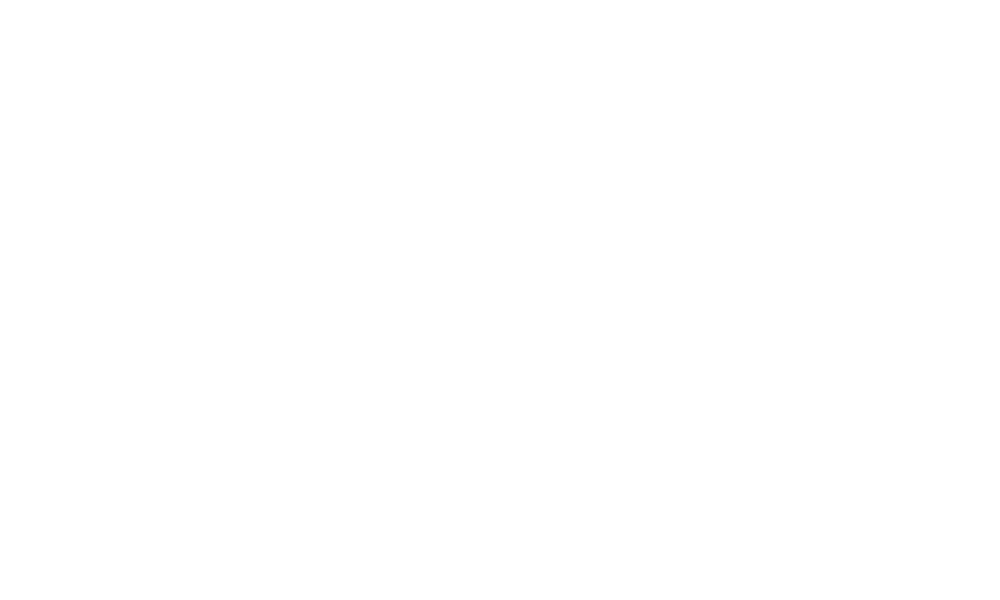

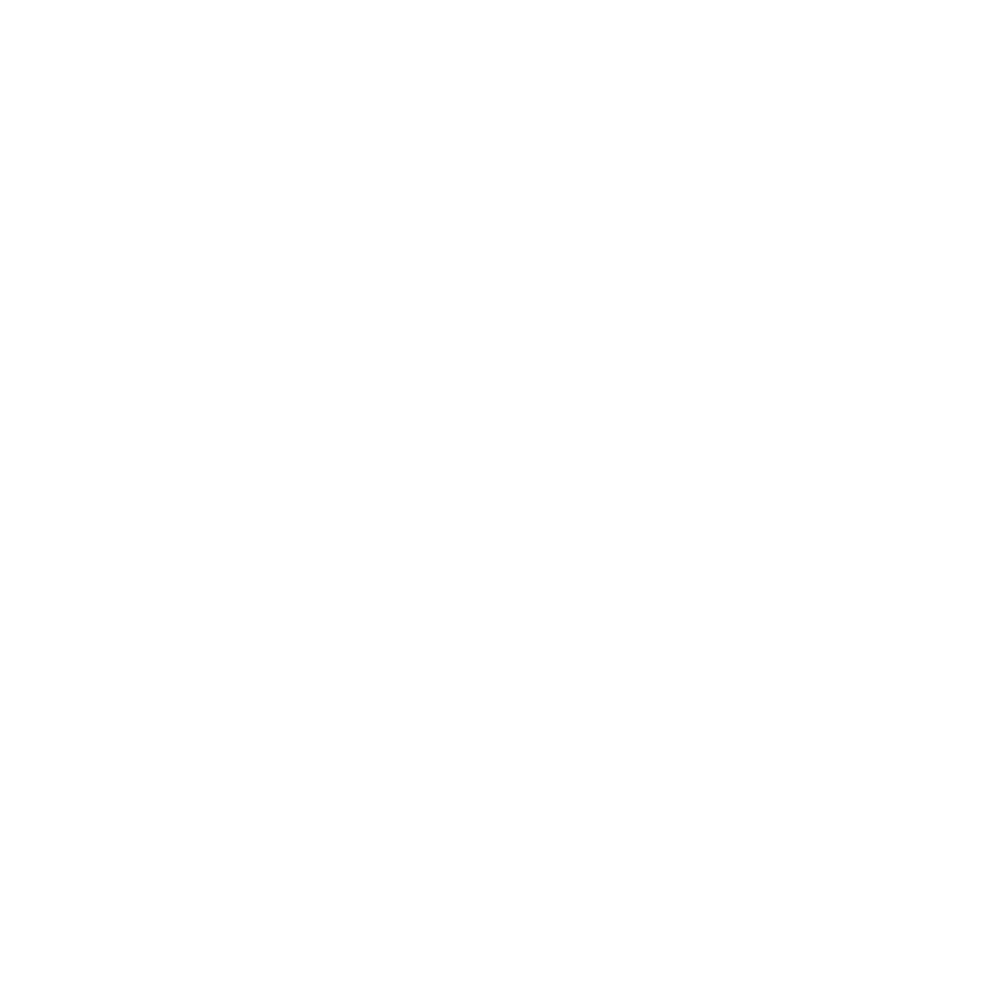

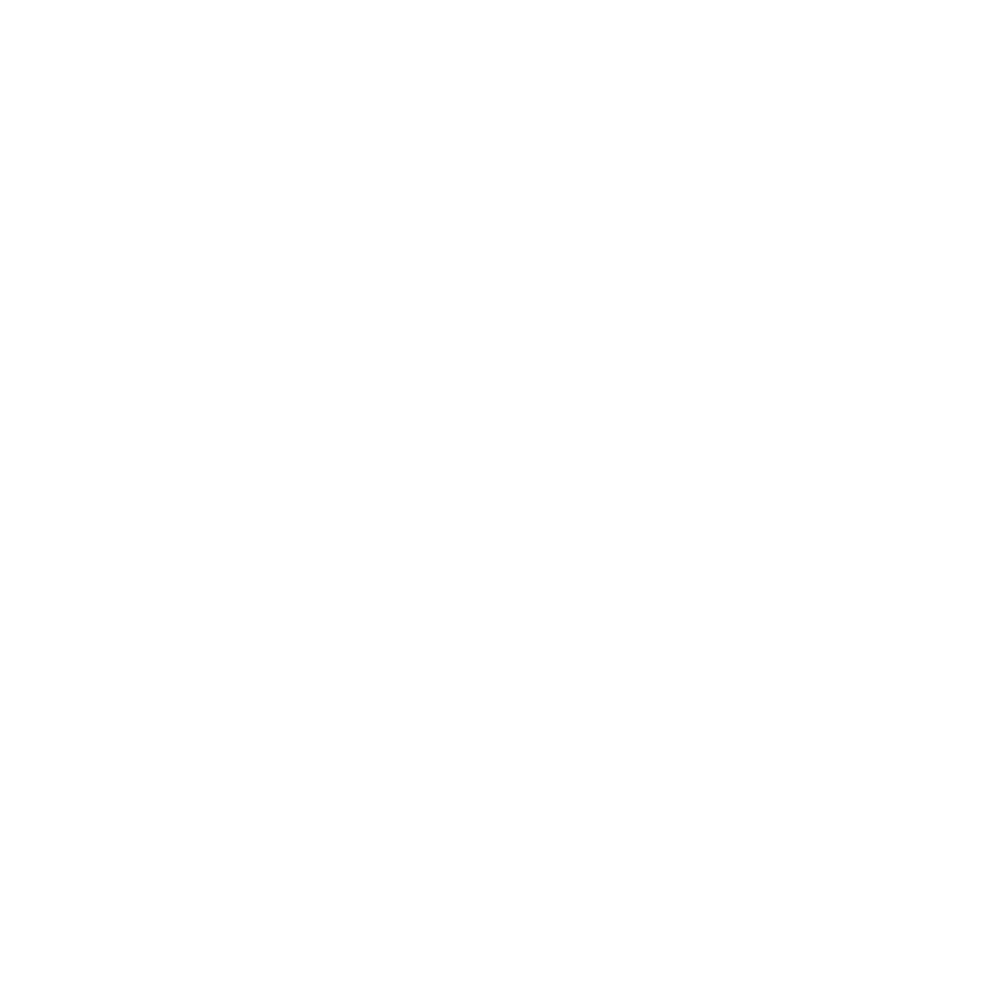

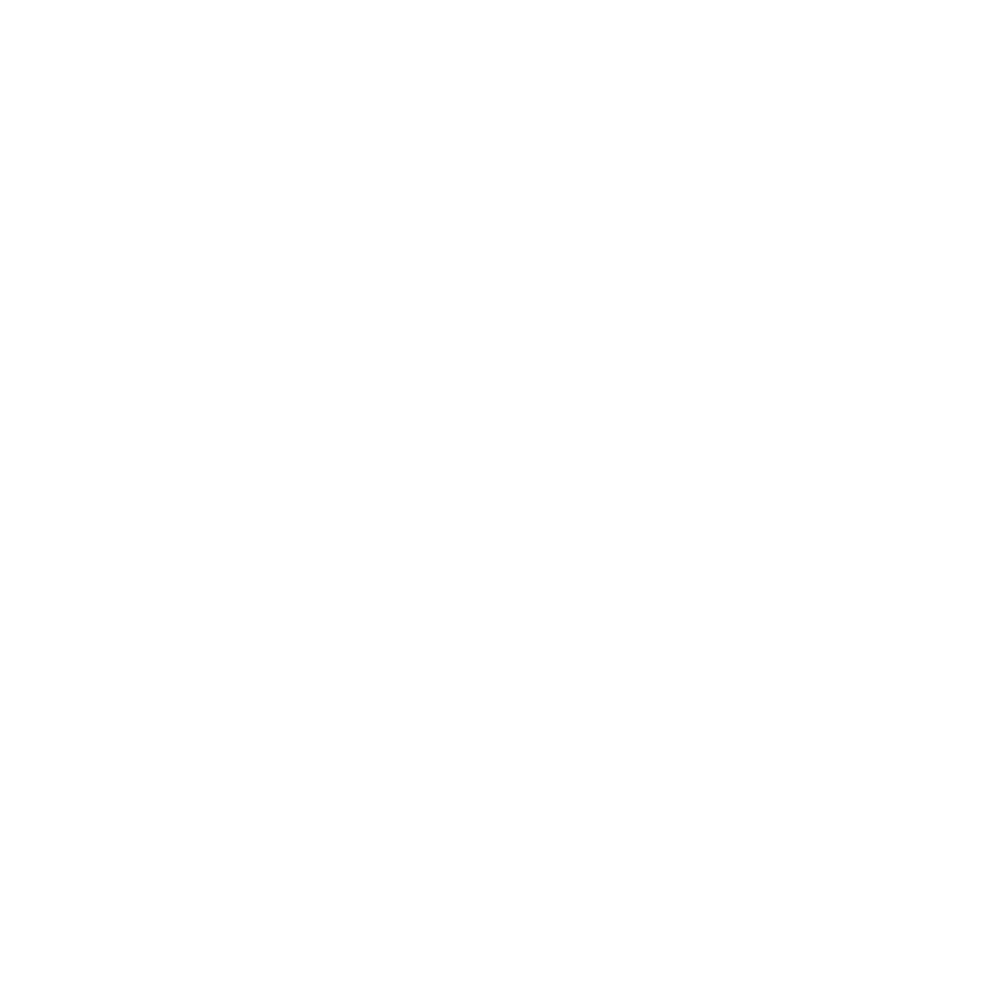

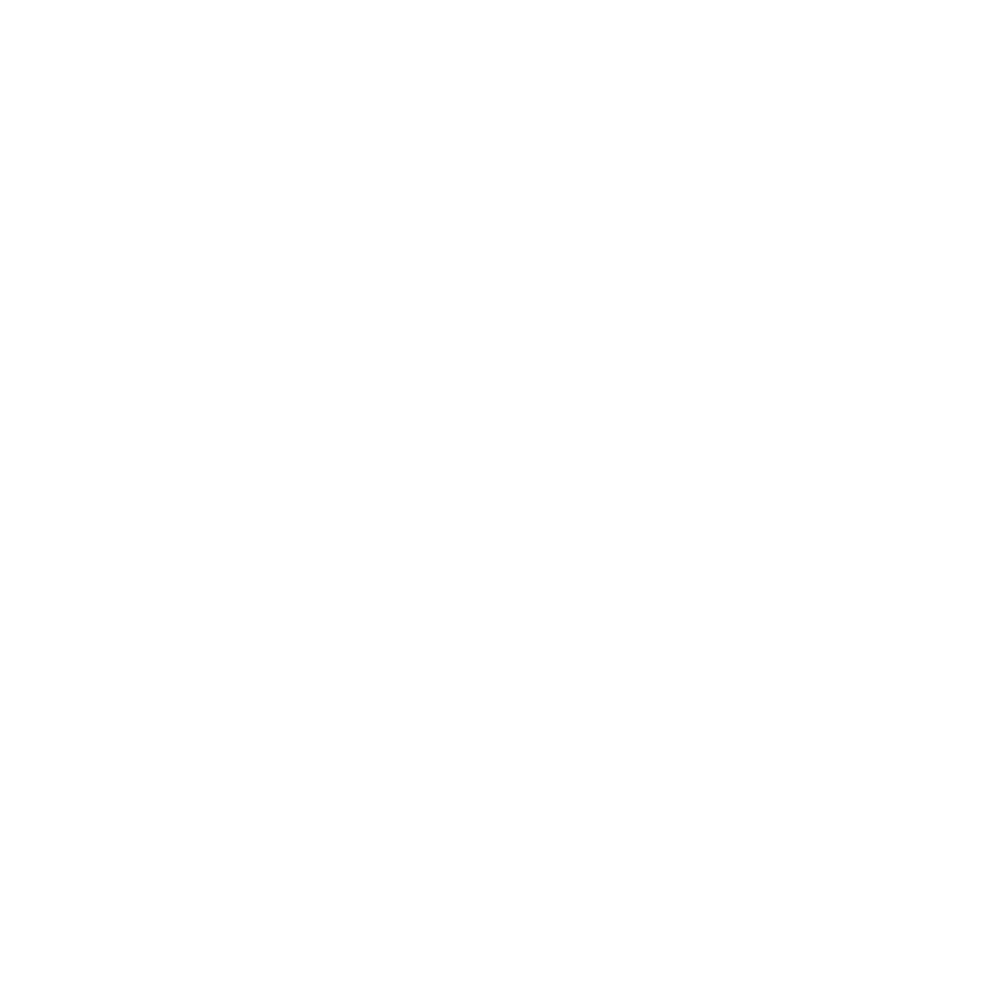

...

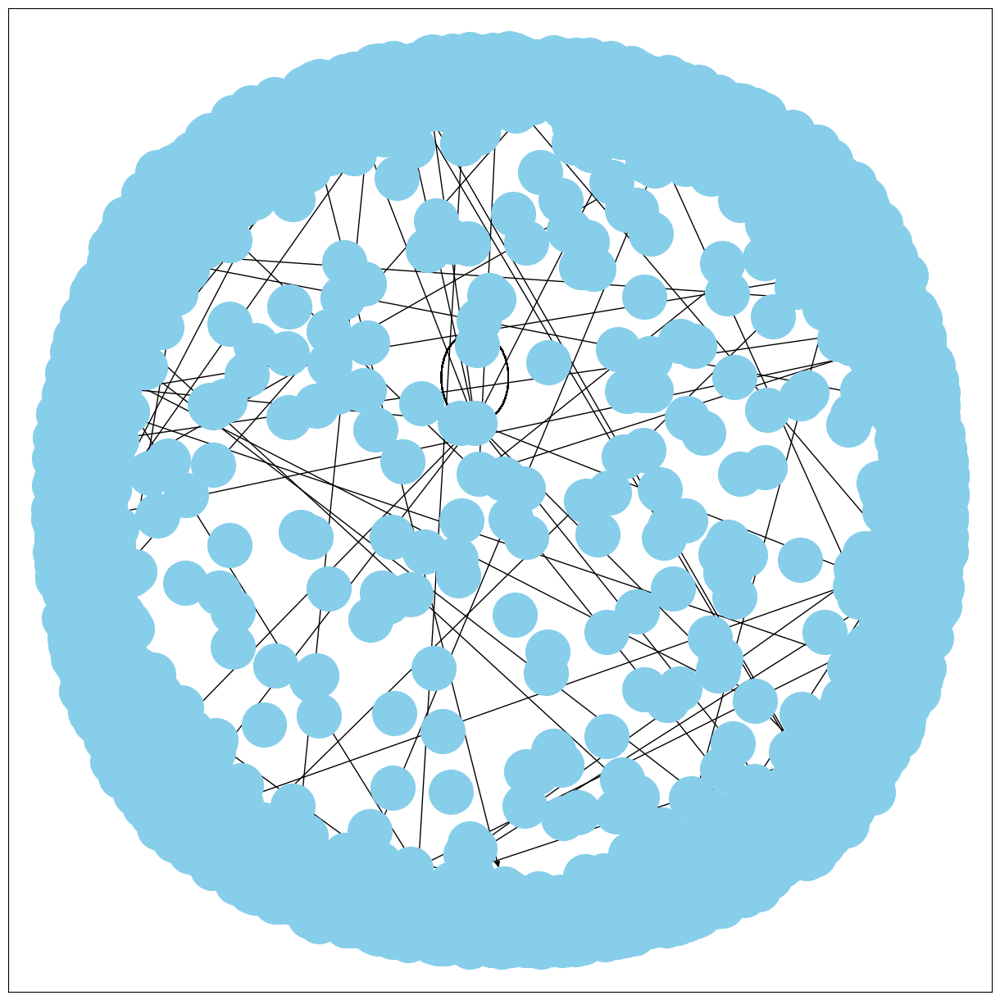

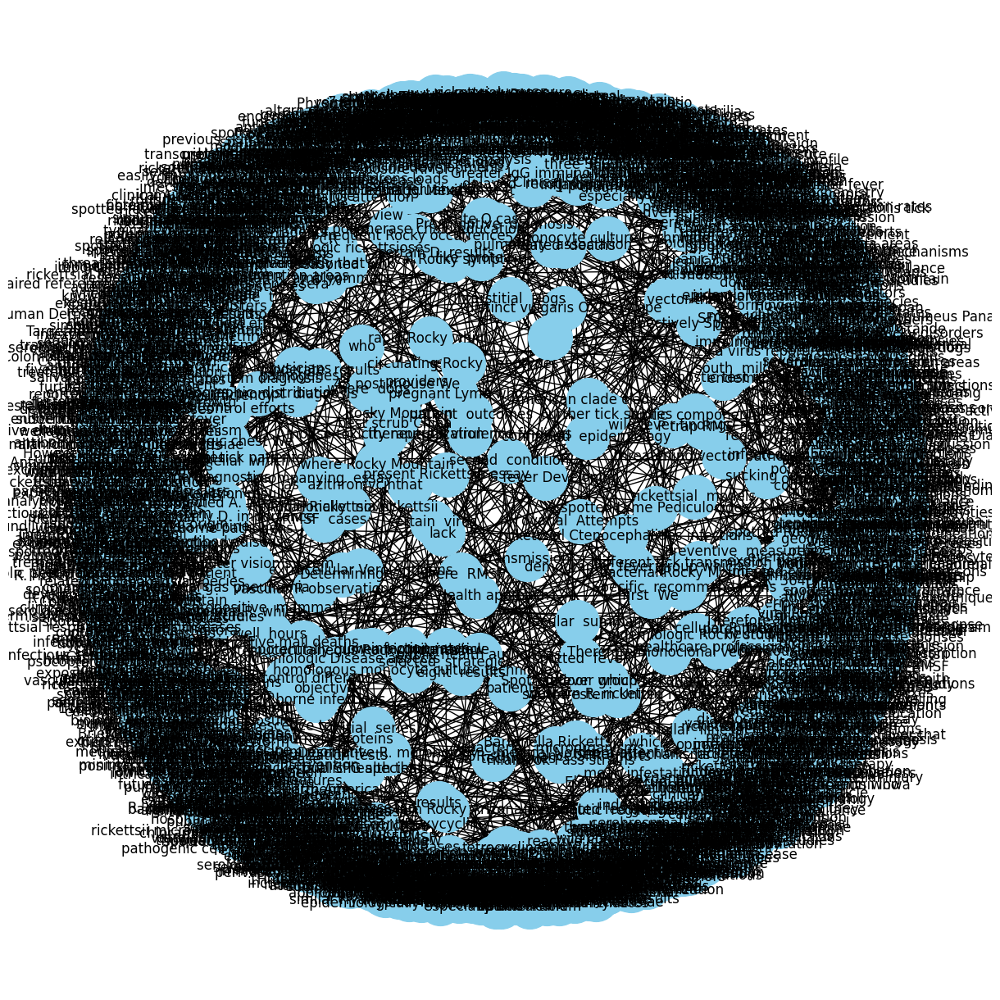

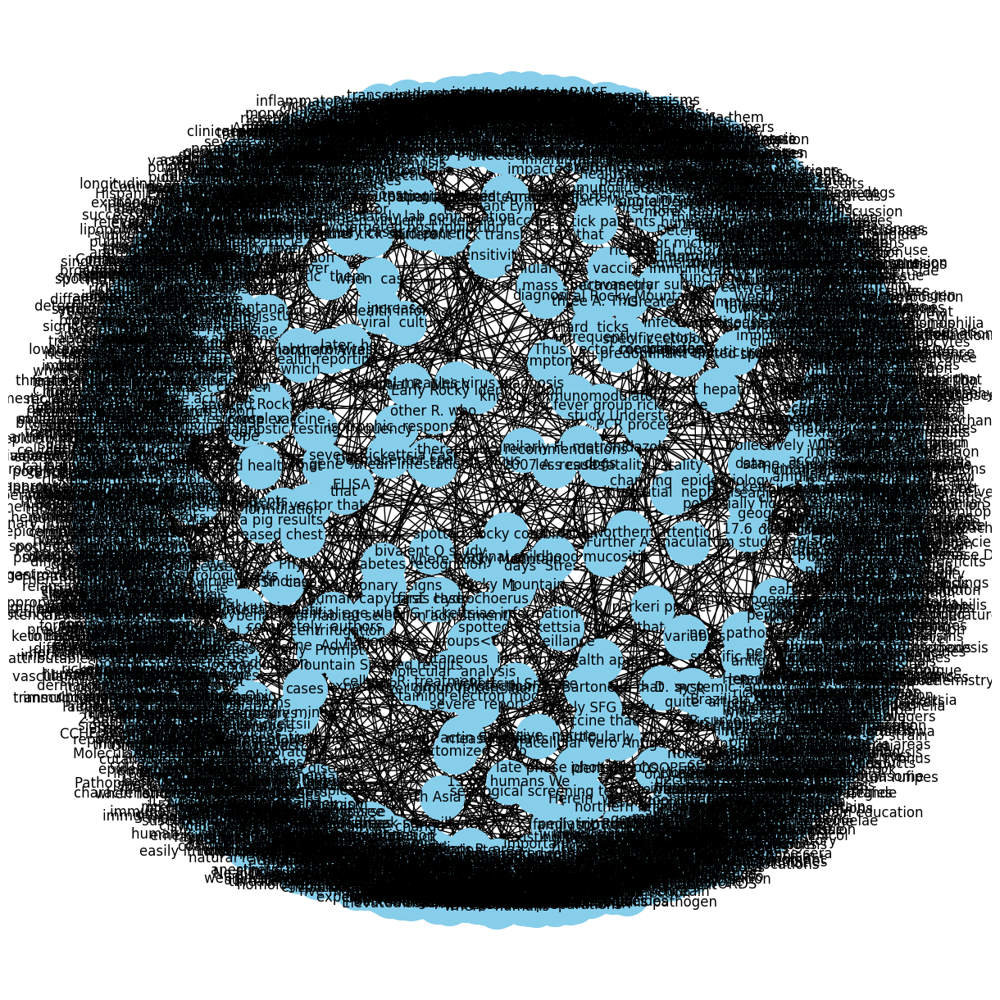

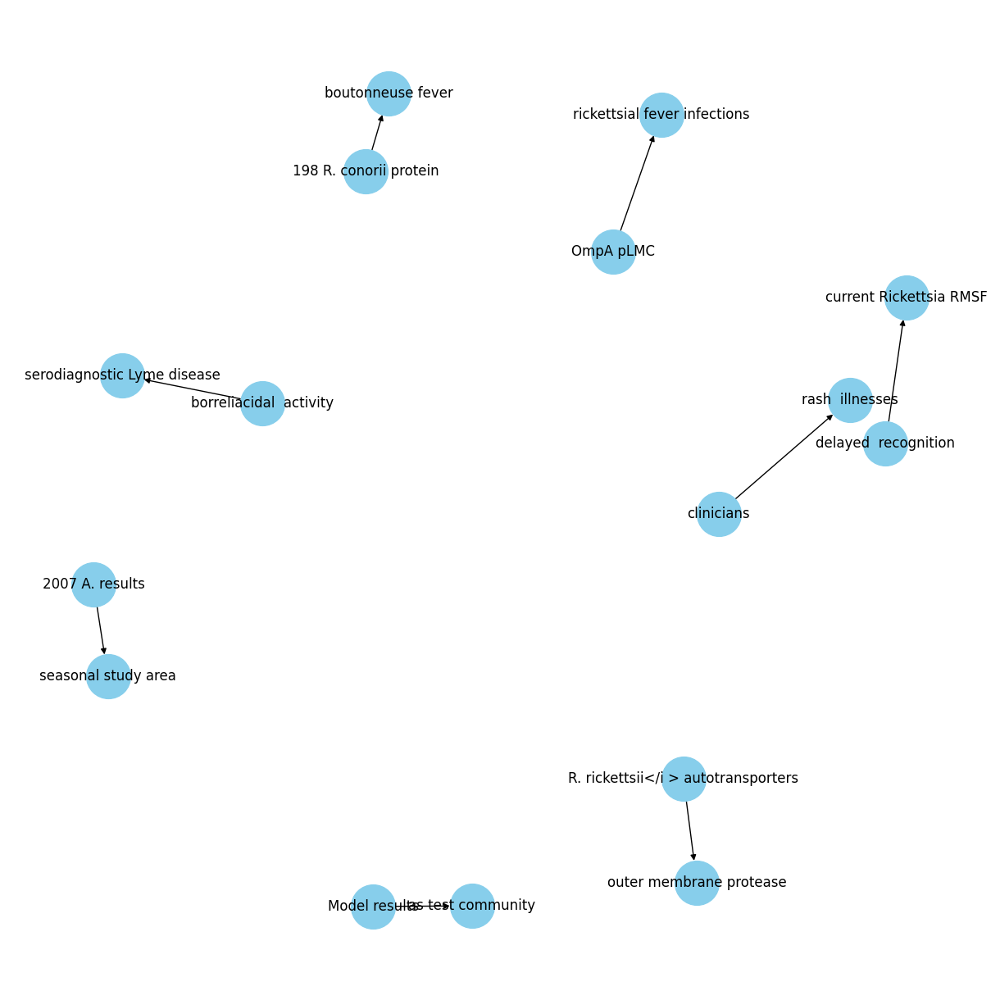

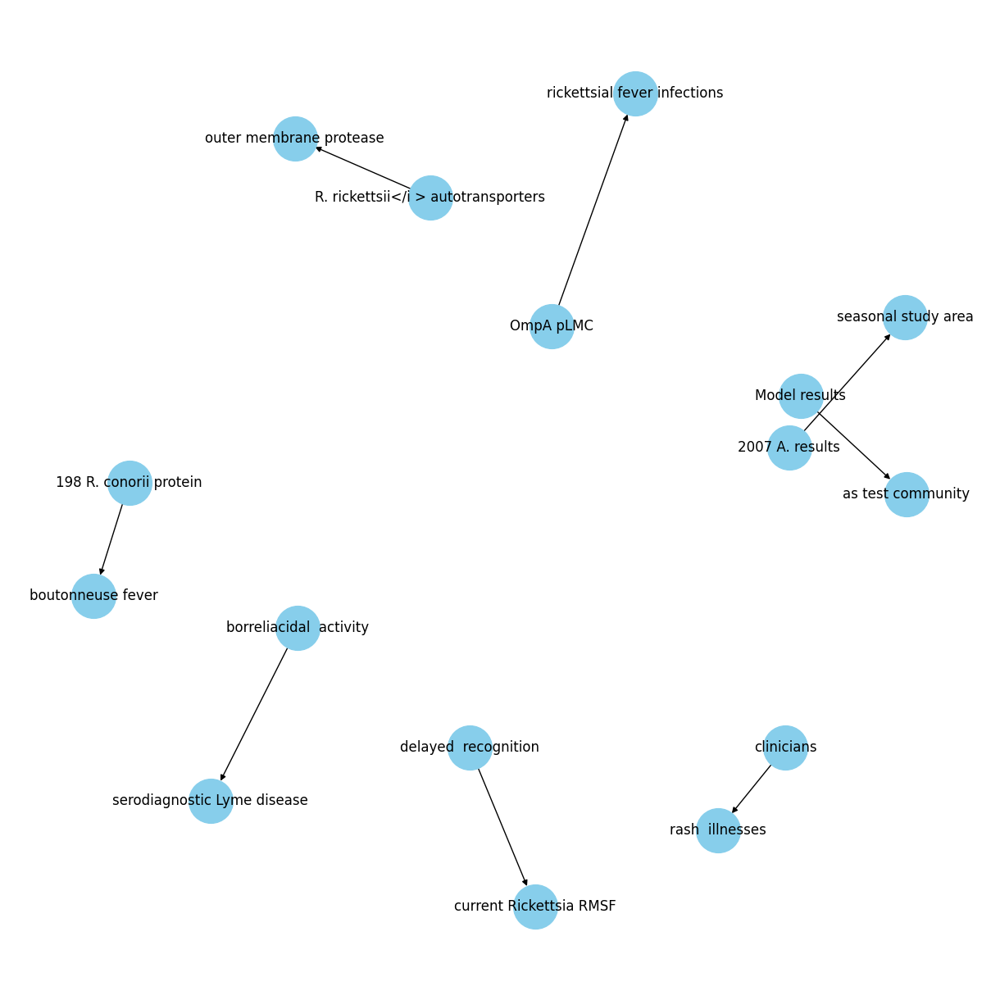

In [63]:
if not filtered_df.empty:
    G = nx.from_pandas_edgelist(filtered_df, "source", "target", edge_attr=True, create_using=nx.MultiDiGraph())

    if G.number_of_nodes() > 0 and G.number_of_edges() > 0:
        plt.figure(figsize=(12, 12))
        pos = nx.spring_layout(G, k=0.5)
        nx.draw(G, with_labels=True, node_color='skyblue', node_size=1500, edge_cmap=plt.cm.Blues, pos=pos)
        plt.show()
    else:
        print("The filtered graph is empty.")
else:
    print("No edges found with the 'edge' value 'show'.")